# Prompt Generator for Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```python
%pip install -U --pre ekorpkit[art]

exit()
```

## Preparing the environment


In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("INFO")
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
workspace_dir = "/content/drive/MyDrive/workspace"
project_name = "ekorpkit-book"
project_dir = eKonf.set_workspace(workspace=workspace_dir, project=project_name)
print("project_dir:", project_dir)

INFO:ekorpkit.utils.notebook:Google Colab not detected.
INFO:ekorpkit.base:Overwriting EKORPKIT_WORKSPACE_ROOT=/workspace with /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT=ekorpkit-book with ekorpkit-book
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT_DIR=/workspace/projects/ekorpkit-book with /content/drive/MyDrive/workspace/projects/ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev40
is colab? False
project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book
time: 941 ms (started: 2022-12-02 09:58:06 +00:00)


## Load a Generator and Generate Prompts

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```python

import os

# Set HuggingFace API token
os.environ["HF_USER_ACCESS_TOKEN"] = "YOUR_TOKEN"
```

In [2]:
from ekorpkit.models.art.prompt import PromptGenerator

pgen = PromptGenerator(verbose=False)

2022-12-02 09:58:07.932579: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:absl:Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO:absl:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: CUDA Host Interpreter
INFO:absl:Unable to initialize backend 'tpu': module 'jaxlib.xla_extension' has no attribute 'get_tpu_client'
INFO:root:compose config with overrides: ['+app/prompt=default']
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:Setting WANDB_PROJECT=ekorpkit-book
INFO:ekorpkit.config:Using existing path: /content/drive/MyDrive/work

time: 11.1 s (started: 2022-12-02 09:58:07 +00:00)


### Loading a model

Before loading a model, you need to train a model first. To train a model, refer to the [Training a Generator](#training-a-generator) section.

In [4]:
# ekorpkit/stable-prompts
pgen.load_model(model_name="ekorpkit/stable-prompts")


INFO:ekorpkit.config:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart
[INFO|training_args.py:1324] 2022-12-02 10:49:20,677 >> PyTorch: setting up devices
[INFO|configuration_utils.py:652] 2022-12-02 10:49:20,678 >> loading configuration file /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/prompt-generator/ekorpkit/stable-prompts/config.json
[INFO|configuration_utils.py:706] 2022-12-02 10:49:20,679 >> Model config GPT2Config {
  "_name_or_path": "/content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/models/prompt-generator/ekorpkit/stable-prompts",
  "_num_labels": 1,
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50258,
  "embd_pdrop": 0.1,
  "eos_token_id": 50259,
  "id2label": {
    "0": "LABEL_0"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0
  },
  "layer_norm_epsilon": 1e-05,
  "model_type": "gpt2",
  "n_ctx": 1024,
  "n_em

time: 1.47 s (started: 2022-12-02 10:49:20 +00:00)


In [5]:
len(pgen.tokenizer.tokenizer_obj)

50260

time: 2.13 ms (started: 2022-12-02 10:59:31 +00:00)


In [11]:
model = pgen.model_obj
model = model.to(pgen.device)

tokenizer = pgen.tokenizer_obj 

encoded_prompt = tokenizer(
    "people looking out a lonely city street", add_special_tokens=True, return_tensors="pt"
).input_ids.to(model.device)
# encoded_prompt
output_sequences = model.generate(
    input_ids=encoded_prompt,
    max_length=70,
    min_length=30,
    temperature=1.2,
    top_k=50,
    top_p=0.9,
    do_sample=True,
    num_return_sequences=5,
    pad_token_id=tokenizer.pad_token_id,  # gets rid of warning
)
# output_sequences
tokenized_start_token = tokenizer.encode(pgen.tokenizer.special_tokens["bos_token"])

generated_texts = []
for i, generated_sequence in enumerate(output_sequences):
    tokens = list(generated_sequence)
#     tokens = []
#     for i, s in enumerate(generated_sequence):
#         if s in tokenized_start_token:
#             print(i, s, "-------XXXXXX")
#         tokens.append(s)

    text = tokenizer.decode(
        tokens, clean_up_tokenization_spaces=True, skip_special_tokens=False
    )
    text = (
        text.strip().replace("\n", " ").replace("/", ",")
    )  # / remove slash. It causes problems in namings
    generated_texts.append(text)
    print(text)
    print()


people looking out a lonely city street art intricate elegant, by fantasy<eop>,,m, painting sharp by,<eop> and<bop> trending the,<bop>.   lighting<eop> and digital painting. a. concept,,, the a,<eop> trending, art by a detailed concept  by, by beautiful<bop> art, art r by with intricate painting focus

people looking out a lonely city street al  with al a digital, and j<eop>  k intricate by intricate by,,  detailed by,  the  intricate a r by detailed g detailed intricate painting by, <bop> illustration illustrationstation., of<eop>,, a j portrait and intricate detailed by art,, intricate,  by g

people looking out a lonely city street fantasy detailed illustration, portrait<eop><eop> in g of, lighting,<bop> digitalstation the painting art illustration, art art art g,<eop> of,astationa art,kowskim a<eop> onstation<eop>, art r k, painting,, portrait highly highly and highly  g,a, of intricate beautiful concept

people looking out a lonely city street of concept the g, a a<eop> g and k, p

### Generating prompts

You can generate prompts using the `generate_prompts` function. The function takes the following arguments:

- `prompt`: The prompt to be used for generating prompts. If `None`, the prompt will be generated automatically.
- `num_prompts_to_generate`: The number of prompts to be generated.
- `generate_images`: Whether to generate images for the prompts.
- `num_samples`: The number of images to be generated for each prompt.
- For other arguments, refer to the following code.


In [4]:
eKonf.print(pgen.generate_config)

{'check_start_token': True,
 'max_prompt_length': 50,
 'min_prompt_length': 30,
 'num_prompts_to_generate': 10,
 'prompt': None,
 'temperature': 1.2,
 'top_k': 70,
 'top_p': 0.9}
time: 1.61 ms (started: 2022-11-11 05:29:29 +00:00)


Prompt: people looking out a lonely city street of flowers by James Rieffler and Peter Smith, artstationby-funket by Adam Boudrillard, painting with a beautiful, dark-dark, blue by Simon Williams and G


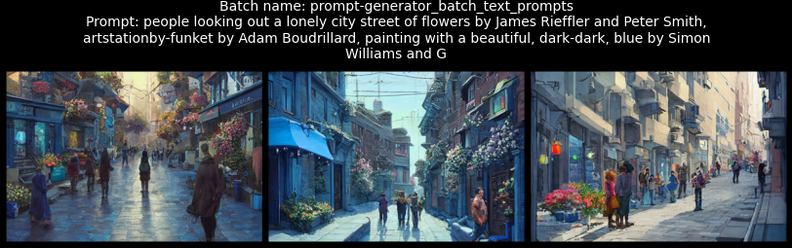

Prompt: people looking out a lonely city street at the sea in a tropical sea, neon neon, white painting by Grosin and Dolly Crespi. by Peter Rokita and Greg Hester and Thomas Moore, artstation paintings by


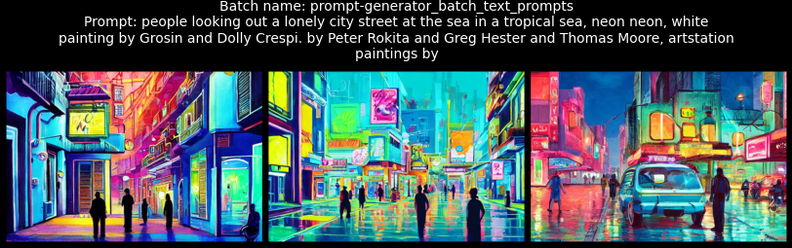

Prompt: people looking out a lonely city street, with portraits of a flower and white in white by Charles Wright and his company, beautiful by Charles Wright and Williamisselart, paintingé


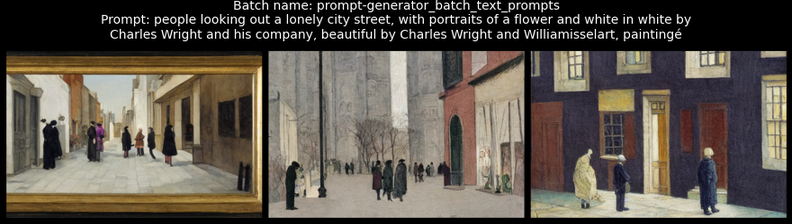

Prompt: people looking out a lonely city street, dark, dark woods, snow forest.  by the lovely ark landscape, gorgeous house landscape, stunning green, shimmeringel styleby paintings, and beautiful


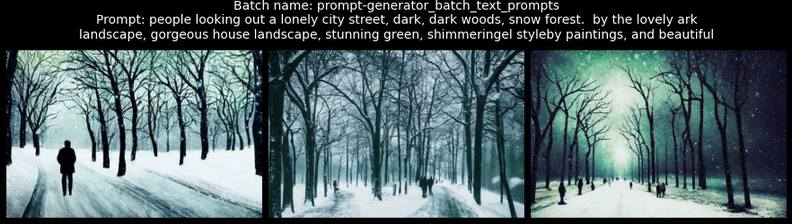

Prompt: people looking out a lonely city street by Tom Hatter on camera with a computer, digital camera, by Martin Harris painter and artstation by William


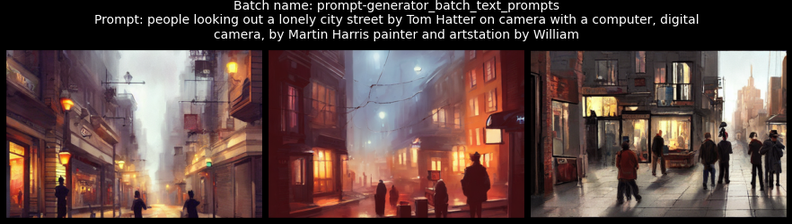

time: 3min 13s (started: 2022-11-11 05:29:29 +00:00)


In [5]:
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=5,
    generate_images=True,
    num_samples=3,
)

### Generating images for prompts

Prompt: people looking out a lonely city street corner. cityscape. By Greg Rutkowski, Ilya Kuvshinov, WLOP, Stanley Artgerm Lau, Ruan Jia and Fenghua Zhong, trending on ArtStation


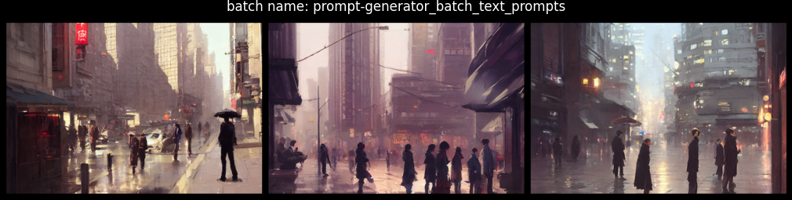

Prompt: people looking out a lonely city street below a lake on a white background, artstation, concept art, matte painting by craig mullins and Anato Finnstark, high detail, volumetric lighting, octane render, 4K resolution


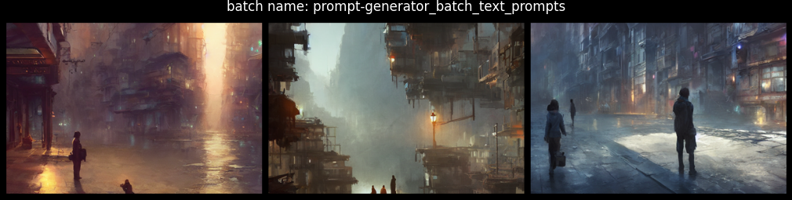

Prompt: people looking out a lonely city street at sunset, fantasy art by greg rutkowski and craig mullins, trending on artstation


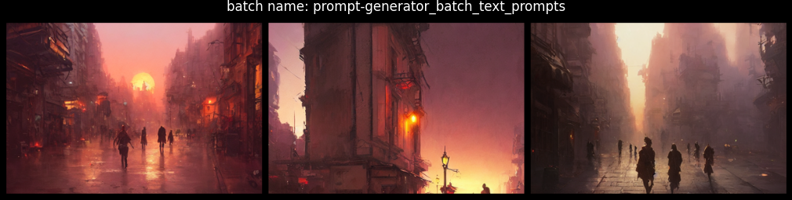

time: 1min 36s (started: 2022-11-10 07:46:05 +00:00)


In [8]:
results = pgen.generate_images(
    prompts=prompts,
    num_samples=3,
)

### Generating images for one prompt

Prompt: people looking out a lonely city street in the snow, concept art portrait of a blonde anime boy with blond hair, high detail, digital art, by greg rutkowski


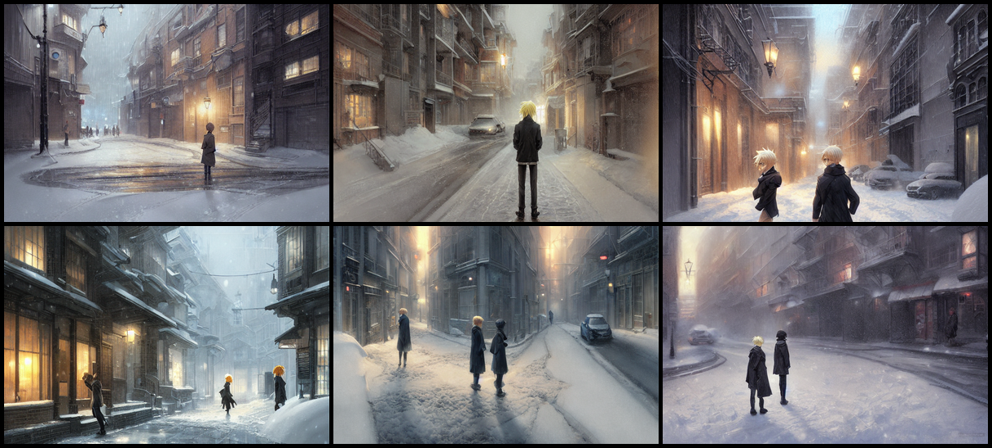

time: 1min 30s (started: 2022-11-10 07:51:57 +00:00)


In [12]:
results = pgen.imagine(
    text_prompts=prompts[0],
    num_samples=6,
    num_inference_steps=150,
    guidance_scale=10,
)

## Training a Generator

### Preparing a dataset

You can use any dataset you want. However, the dataset should be in the format of [HuggingFace Datasets](https://huggingface.co/docs/datasets/).

1. Using a dataset from HuggingFace Hub

In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("INFO")
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
workspace_dir = "/content/drive/MyDrive/workspace"
project_name = "ekorpkit-book"
project_dir = eKonf.set_workspace(workspace=workspace_dir, project=project_name)
print("project_dir:", project_dir)

INFO:ekorpkit.utils.notebook:Google Colab not detected.
INFO:ekorpkit.base:Overwriting EKORPKIT_WORKSPACE_ROOT=/workspace with /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT=ekorpkit-book with ekorpkit-book
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Overwriting EKORPKIT_PROJECT_DIR=/workspace/projects/ekorpkit-book with /content/drive/MyDrive/workspace/projects/ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev40
is colab? False
project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book
time: 1 s (started: 2022-12-02 11:40:17 +00:00)


In [2]:
from ekorpkit.models.art.prompt import PromptGenerator

pgen = PromptGenerator(verbose=False)

pgen.dataset.validation_split_percentage = 5
pgen.load_datasets("Gustavosta/Stable-Diffusion-Prompts")
pgen.raw_datasets

2022-12-02 11:40:19.025078: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
INFO:absl:Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
INFO:absl:Unable to initialize backend 'rocm': NOT_FOUND: Could not find registered platform with name: "rocm". Available platform names are: Host Interpreter CUDA
INFO:absl:Unable to initialize backend 'tpu': module 'jaxlib.xla_extension' has no attribute 'get_tpu_client'
INFO:root:compose config with overrides: ['+app/prompt=default']
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env
INFO:ekorpkit.base:Setting WANDB_PROJECT=ekorpkit-book
INFO:ekorpkit.config:Using existing path: /content/drive/MyDrive/work

  0%|          | 0/2 [00:00<?, ?it/s]

INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.builder:Overwrite dataset info from restored data version.
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec
INFO:datasets.info:Loading Dataset info from /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0

DatasetDict({
    train: Dataset({
        features: ['Prompt'],
        num_rows: 70032
    })
    test: Dataset({
        features: ['Prompt'],
        num_rows: 8192
    })
    validation: Dataset({
        features: ['Prompt'],
        num_rows: 3686
    })
})

time: 25.5 s (started: 2022-12-02 11:40:18 +00:00)


In [ ]:
model_name = "ekorpkit/stable-prompts"

pgen.dataset.line_by_line = False
pgen.dataset.affix_bos_eos_to_sentences = False
pgen.dataset.group_by_shuffling = True
pgen.training.num_train_epochs = 2
pgen.training.logging_steps = 100
pgen.model.model_name = model_name
pgen.model.ignore_model_path = True

pgen.train()

INFO:ekorpkit.config:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart
[INFO|training_args.py:1324] 2022-12-02 11:40:44,404 >> PyTorch: setting up devices
[INFO|tokenization_auto.py:427] 2022-12-02 11:40:45,313 >> Could not locate the tokenizer configuration file, will try to use the model config instead.
[INFO|configuration_utils.py:654] 2022-12-02 11:40:46,189 >> loading configuration file config.json from cache at /content/drive/MyDrive/workspace/.cache/models--distilgpt2/snapshots/ee0b29d316a6a55fd15c50c4a97aca80ab4dd66a/config.json
[INFO|configuration_utils.py:706] 2022-12-02 11:40:46,190 >> Model config GPT2Config {
  "_name_or_path": "distilgpt2",
  "_num_labels": 1,
  "activation_function": "gelu_new",
  "architectures": [
    "GPT2LMHeadModel"
  ],
  "attn_pdrop": 0.1,
  "bos_token_id": 50256,
  "embd_pdrop": 0.1,
  "eos_token_id": 50256,
  "id2label": {
    "0": "LABEL_0"
  },
  "initializer_range": 0.02,
  "label2id": {
    "LABEL_0": 0
  },


Running tokenizer on every text in dataset:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-346b456d87f6465c.arrow


Running tokenizer on every text in dataset:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-07ba13fad195995b.arrow


Running tokenizer on every text in dataset:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-0e0b89f4e3ef4d89.arrow


Grouping texts in chunks of 1024:   0%|          | 0/71 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-de3c6f4e94dbc9fc.arrow


Grouping texts in chunks of 1024:   0%|          | 0/9 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-b6fcbfa7f2751577.arrow


Grouping texts in chunks of 1024:   0%|          | 0/4 [00:00<?, ?ba/s]

INFO:datasets.arrow_dataset:Caching processed dataset at /content/drive/MyDrive/workspace/.cache/Gustavosta___parquet/Gustavosta--Stable-Diffusion-Prompts-d22aeec0ba2a9fdb/0.0.0/2a3b91fbd88a2c90d1dbbb32b460cf621d31bd5b05b934492fdef7d8d6f236ec/cache-29b4b3cc41793fad.arrow
[INFO|trainer.py:557] 2022-12-02 11:41:13,870 >> Using cuda_amp half precision backend
INFO:ekorpkit.config:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator/configs/prompt-generator(20)_config.yaml
INFO:ekorpkit.config:Saving config to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator/configs/prompt-generator(20)_config.json
[INFO|trainer.py:725] 2022-12-02 11:41:14,133 >> The following columns in the training set don't have a corresponding argument in `GPT2LMHeadModel.forward` and have been ignored: special_tokens_mask. If special_tokens_mask are not expected by `GPT2LMHeadModel.forward`,  you can safely ignore this message.
[I

[WARNING|logging.py:275] 2022-12-02 11:41:21,711 >> You're using a GPT2TokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(0).png
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(0).png


Prompt[0]: people looking out a lonely city street sharp the k on, and 8a, kkowski trending g, k fantasy a trending, jm illustration, concept the,  focus realistic intricate art lighting, and portrait,,, of beautiful trending


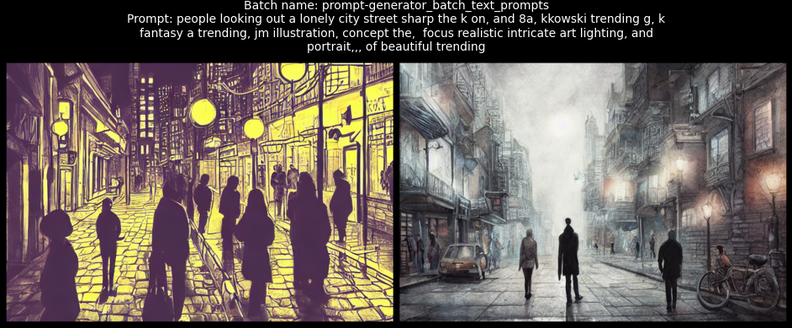

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(1).png
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(1).png


Prompt[1]: people looking out a lonely city street. the the g the sharp a portrait -, digital and,, high digital of byger on, conceptkowski inkowski gkowski, detailed of much, fantasy g of andut illustration intricate with  concept


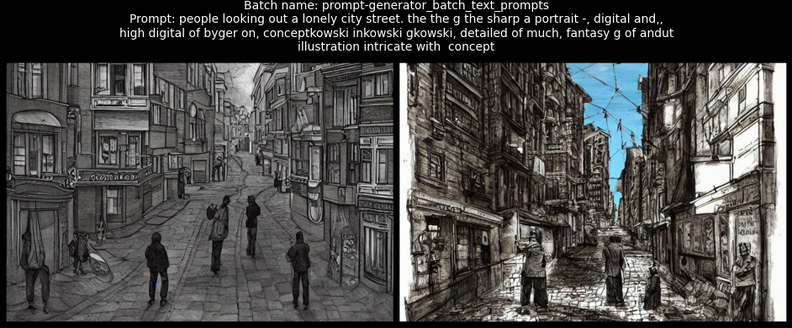

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(2).png
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(2).png


Prompt[2]: people looking out a lonely city street,,,, trendinga, and ofut of,kowski with art,,, g, and with 8 and by on concept by r. j, by art elegant digital d intricate portrait digital.


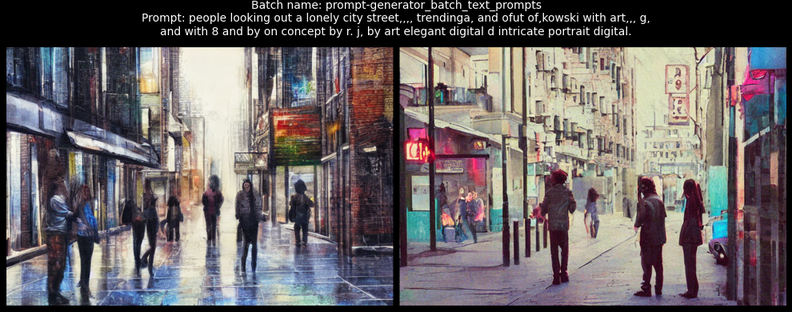

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(3).png
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(3).png


Prompt[3]: people looking out a lonely city street portrait portrait and illustration elegant,, in with and of the a and and portraitm. al a, sharp illustrationger a,,, by, conceptger, and detailed r with and,, a beautiful


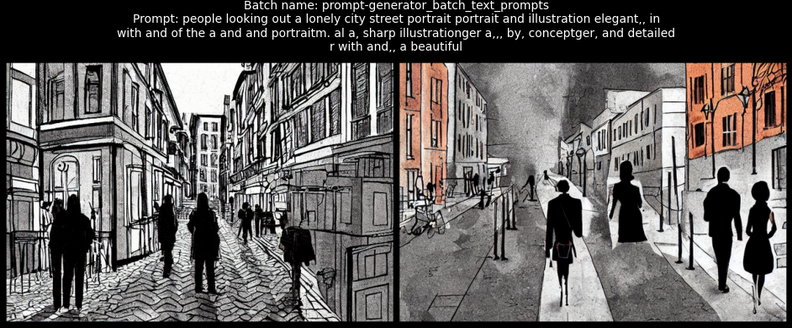

INFO:ekorpkit.visualize.collage:Creating collage of 2 images with 2 columns from 2 images
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(4).png
INFO:ekorpkit.visualize.collage:Saved collage to /content/drive/MyDrive/workspace/projects/ekorpkit-book/aiart/outputs/prompt-generator_batch/prompt-generator_batch_text_prompts(0)_run_configs_text_prompts(4).png


Prompt[4]: people looking out a lonely city street realistic by beautiful fantasy, of in by highly al al by,ger by, art and sharp art j and  intricate, highly and and,, art painting, illustration detailed by and digital style fantasy art


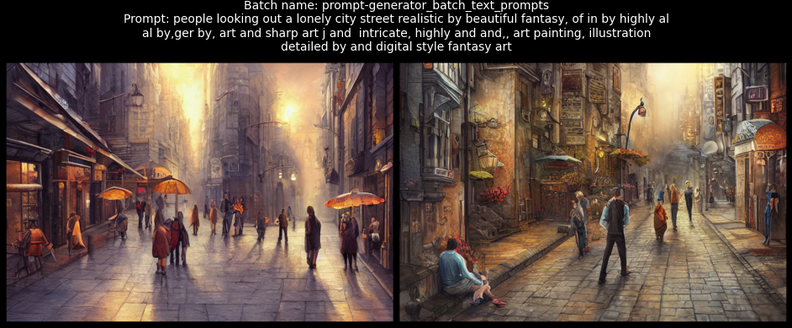

time: 2min 19s (started: 2022-12-02 11:32:52 +00:00)


In [4]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

2. Using a dataset from a text file

In [3]:
prompt_uri = "https://raw.githubusercontent.com/entelecheia/ekorpkit-book/main/assets/data/prompt_parrot.txt"
dataset = pgen.load_dataset("text", data_files=prompt_uri)
dataset

  0%|          | 0/1 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text'],
        num_rows: 185
    })
})

time: 1.29 s (started: 2022-11-10 09:41:31 +00:00)


In [4]:
eKonf.print(pgen.train_config)
eKonf.print(pgen.trainer_config)

{'batch_size': 10000,
 'num_shuffles': 4,
 'padding': 'max_length',
 'pretrained_model_name_or_path': 'distilgpt2',
 'prompt_column': 'Prompt',
 'shuffle_prompts': True,
 'split': 'train'}
{'logging_steps': 200,
 'num_train_epochs': 1,
 'overwrite_output_dir': True,
 'per_device_train_batch_size': 1,
 'prediction_loss_only': True,
 'report_to': 'wandb',
 'run_name': 'ekorpkit/stable-prompts',
 'save_steps': 0,
 'seed': None}
time: 2.66 ms (started: 2022-11-10 09:41:37 +00:00)


In [5]:
pgen.train_config.shuffle_prompts = False
pgen.trainer_config.num_train_epochs = 3
model_name="ekorpkit/prompt_parrot"

pgen.train(model_name=model_name, dataset=dataset, prompt_column="text")

  0%|          | 0/1 [00:00<?, ?ba/s]

***** Running training *****
  Num examples = 185
  Num Epochs = 3
  Instantaneous batch size per device = 1
  Total train batch size (w. parallel, distributed & accumulation) = 8
  Gradient Accumulation steps = 1
  Total optimization steps = 72
Automatic Weights & Biases logging enabled, to disable set os.environ["WANDB_DISABLED"] = "true"
wandb: Currently logged in as: entelecheia. Use `wandb login --relogin` to force relogin


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




train/epoch,▁
train/global_step,▁
train/total_flos,▁
train/train_loss,▁
train/train_runtime,▁
train/train_samples_per_second,▁
train/train_steps_per_second,▁
train/epoch,3.0
train/global_step,72
train/total_flos,145019696578560.0
train/train_loss,8.11367


Configuration saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/config.json
Model weights saved in /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen/models/ekorpkit/prompt_parrot/pytorch_model.bin


time: 1min 32s (started: 2022-11-10 09:42:17 +00:00)


Prompt: people looking out a lonely city street. vibrant nightscape landscape by Jean Eichler & Tom Riezzler, paintingstation paintingine de Jean du Fontaine


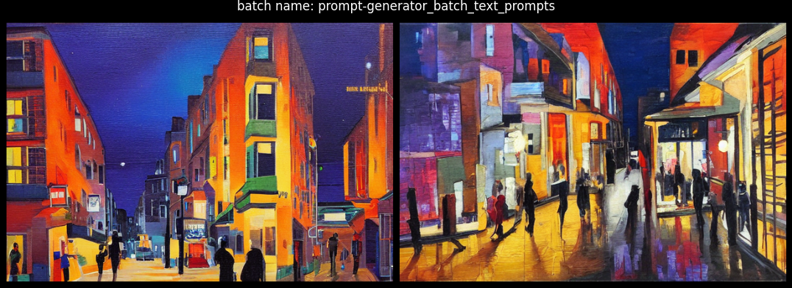

Prompt: people looking out a lonely city street street in a beautiful landscape by Steven Adams, lushly, and landscapes by Robert F. Bennett, The Lost and Skyward, a matte art by Alex Turner, matte painterabby, pixelism


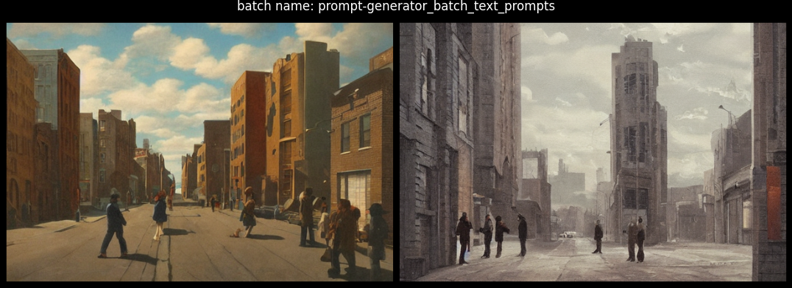

time: 1min 14s (started: 2022-11-10 09:43:50 +00:00)


In [6]:
pgen.load_model(model_name=model_name)
prompts = pgen.generate_prompts(
    prompt="people looking out a lonely city street",
    num_prompts_to_generate=2,
    generate_images=True,
    num_samples=2,
)

## References

- [Gustavosta/Stable-Diffusion-Prompts](https://huggingface.co/datasets/Gustavosta/Stable-Diffusion-Prompts)